In [1]:
import re
import math
import itertools
import pandas as pd
pd.set_option('display.max_colwidth',10000)
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif']=['Microsoft YaHei']
plt.rcParams['axes.unicode_minus']=False

In [51]:
# comment数据
store = pd.HDFStore('C:/Users/DWu60/Desktop/Case1_NLP/result_analyse/tagged_comments_result.h5')
result = pd.DataFrame()
for i in range(len(store.keys())):
    df = store.get(f'/brand' + str(i))
    result = pd.concat([result, df])
store.close()

In [52]:
a = [(('性能', '回弹(正面)'), ('运动性能', '回弹(正面)')),
     (('性能', '回弹(负面)'), ('运动性能', '回弹(负面)')),
     (('性能', '提速(正面)'), ('运动性能', '提速(正面)')),
     (('性能', '提速(负面)'), ('运动性能', '提速(负面)'))
    ]
for right, wrong in a:
    result[right] = result.loc[:, [right, wrong]].max(axis=1)
    del result[wrong]

In [53]:
result = result[~((result['品牌'] == 'Lining/李宁') & (result['单品'].str.contains('昂跑')))]

In [54]:
result[('跑步类', '跑步类(正面)')] = result.loc[:, [('适用场景', '训练(正面)'), ('适用场景', '跑步(正面)'), ('适用场景', '马拉松(正面)')]].max(axis=1)
result[('跑步类', '跑步类(负面)')] = result.loc[:, [('适用场景', '训练(负面)'), ('适用场景', '跑步(负面)'), ('适用场景', '马拉松(负面)')]].max(axis=1)
result[('非运动类', '非运动类(正面)')] = result.loc[:, [('适用场景', '工作通勤(正面)'), ('适用场景', '搭配(正面)'), ('适用场景', '日常休闲(正面)')]].max(axis=1)
result[('非运动类', '非运动类(负面)')] = result.loc[:, [('适用场景', '工作通勤(负面)'), ('适用场景', '搭配(负面)'), ('适用场景', '日常休闲(负面)')]].max(axis=1)

In [55]:
len(result)

911073

# 一二级属性

In [56]:
# 各一二级属性
aspect = list(result.columns)
aspect_1 = aspect[6:len(aspect)-5]
aspect_2 = aspect[len(aspect)-4:]
aspect = aspect_1 + aspect_2
aspect

[('人群', '兄弟姐妹'),
 ('人群', '其他长辈'),
 ('人群', '女朋友/老婆'),
 ('人群', '奶奶'),
 ('人群', '婆婆'),
 ('人群', '家人'),
 ('人群', '对象'),
 ('人群', '小孩'),
 ('人群', '母亲'),
 ('人群', '父亲'),
 ('人群', '父母'),
 ('人群', '爷爷'),
 ('人群', '男朋友/老公'),
 ('价格', '其他(正面)'),
 ('价格', '其他(负面)'),
 ('保护', '其他(正面)'),
 ('保护', '其他(负面)'),
 ('保护', '包裹性(正面)'),
 ('保护', '包裹性(负面)'),
 ('保护', '支撑性(正面)'),
 ('保护', '支撑性(负面)'),
 ('保护', '稳定性(正面)'),
 ('保护', '稳定性(负面)'),
 ('保护', '缓震(正面)'),
 ('保护', '缓震(负面)'),
 ('保护', '防侧翻(正面)'),
 ('保护', '防侧翻(负面)'),
 ('保护', '防水(正面)'),
 ('保护', '防水(负面)'),
 ('保护', '防滑(正面)'),
 ('保护', '防滑(负面)'),
 ('做工', '其他(正面)'),
 ('做工', '其他(负面)'),
 ('做工', '材质(正面)'),
 ('做工', '材质(负面)'),
 ('做工', '正品(正面)'),
 ('做工', '正品(负面)'),
 ('做工', '质量(正面)'),
 ('做工', '质量(负面)'),
 ('复购', '不会复购'),
 ('复购', '可能复购'),
 ('复购', '品牌复购'),
 ('复购', '品牌热爱'),
 ('复购', '已经复购'),
 ('复购', '更新换代复购'),
 ('好看', '其他(正面)'),
 ('好看', '其他(负面)'),
 ('好看', '鞋型(正面)'),
 ('好看', '鞋型(负面)'),
 ('好看', '颜色(正面)'),
 ('好看', '颜色(负面)'),
 ('性能', '其他(正面)'),
 ('性能', '其他(负面)'),
 ('性能', '回弹(正面)'),
 ('性能', '回弹(负面)'

In [57]:
# 一二级匹配
tag_1_tag_2 = pd.DataFrame(aspect)
tag_1_tag_2.columns = ['tag_1', 'tag_2']
tag_1_tag_2_classification = tag_1_tag_2.groupby('tag_1').apply(lambda x: list(itertools.chain(x['tag_2'].tolist())))
dict_tag_1_tag_2 = dict(tag_1_tag_2_classification)
dict_tag_1_tag_2

{'人群': ['兄弟姐妹',
  '其他长辈',
  '女朋友/老婆',
  '奶奶',
  '婆婆',
  '家人',
  '对象',
  '小孩',
  '母亲',
  '父亲',
  '父母',
  '爷爷',
  '男朋友/老公'],
 '价格': ['其他(正面)', '其他(负面)'],
 '保护': ['其他(正面)',
  '其他(负面)',
  '包裹性(正面)',
  '包裹性(负面)',
  '支撑性(正面)',
  '支撑性(负面)',
  '稳定性(正面)',
  '稳定性(负面)',
  '缓震(正面)',
  '缓震(负面)',
  '防侧翻(正面)',
  '防侧翻(负面)',
  '防水(正面)',
  '防水(负面)',
  '防滑(正面)',
  '防滑(负面)'],
 '做工': ['其他(正面)',
  '其他(负面)',
  '材质(正面)',
  '材质(负面)',
  '正品(正面)',
  '正品(负面)',
  '质量(正面)',
  '质量(负面)'],
 '复购': ['不会复购', '可能复购', '品牌复购', '品牌热爱', '已经复购', '更新换代复购'],
 '好看': ['其他(正面)', '其他(负面)', '鞋型(正面)', '鞋型(负面)', '颜色(正面)', '颜色(负面)'],
 '性能': ['其他(正面)',
  '其他(负面)',
  '回弹(正面)',
  '回弹(负面)',
  '提速(正面)',
  '提速(负面)',
  '缓震(正面)',
  '缓震(负面)',
  '轻量(正面)',
  '轻量(负面)'],
 '服务': ['其他(正面)',
  '其他(负面)',
  '包装(正面)',
  '包装(负面)',
  '客服(正面)',
  '客服(负面)',
  '物流(正面)',
  '物流(负面)',
  '购物体验(正面)',
  '购物体验(负面)'],
 '精神认同': ['国货', '明星代言', '李佳琦'],
 '耐久度': ['其他(正面)', '其他(负面)'],
 '脚型适配': ['其他(正面)', '其他(负面)', '脚型(正面)', '脚型(负面)', '鞋码(正面)', '鞋码(负面)'],
 '舒适': ['其他(正面)',
 

# 各单品评论统计及适用场景信息熵

### 各单品评论统计

In [58]:
brand_product_len = pd.DataFrame(result.groupby(['品牌','单品'])[['评论序号']].count()).reset_index()
brand_product_len.columns = ['品牌','单品','评论数']

In [59]:
# level1数据
brand_level_1 = pd.read_csv('C:/Users/DWu60/Desktop/map_aggain.csv')
brand_level_1 = brand_level_1.drop_duplicates(subset=['标题', 'MODEL_AD2', 'price_mode'])[['标题', 'MODEL_AD2', 'new_price']]
brand_level_1 = brand_level_1[:][['标题', 'MODEL_AD2']]
brand_level_1.columns = ['单品','MODEL_AD2']

In [60]:
brand_product_len_level = pd.merge(brand_product_len, brand_level_1, how='left')

In [61]:
# level2数据
brand_level_2 = pd.read_excel('C:/Users/DWu60/Desktop/Case1_NLP/result_analyse/all_shoes_segment_with_tag.xlsx')
brand_level_2 = brand_level_2[:][['品牌','MODEL_AD2','segment_manually']]

C:\Users\DWu60\Anaconda3\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
C:\Users\DWu60\Anaconda3\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)


In [62]:
brand_product_len_level = pd.merge(brand_product_len_level, brand_level_2, how='left')
brand_product_len_level

,品牌,单品,评论数,MODEL_AD2,segment_manually
0,361°,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,3013,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,D
1,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,705,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,D
2,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,1764,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,D
3,361°,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,649,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,D
4,361°,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,1264,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,D
5,361°,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,2689,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,D
6,361°,361男鞋运动鞋2021夏季新款轻便透气跑步鞋361度气垫鞋减震跑鞋悟,610,361男鞋运动鞋2021夏季新款轻便透气跑步鞋361度气垫鞋减震跑鞋悟,D
7,361°,361男鞋运动鞋2021夏季新款轻便透气跑鞋减震耐磨跑步鞋黑色鞋子,437,361男鞋运动鞋2021夏季新款轻便透气跑鞋减震耐磨跑步鞋黑色鞋子,D
8,361°,361男鞋运动鞋2021春季新款NFO网面轻便跑鞋361度透气减震跑步鞋,457,NFO,A
9,361°,361男鞋运动鞋2021秋季新款轻便减震跑鞋361度革面防水跑步鞋男子,1660,361男鞋运动鞋2021秋季新款轻便减震跑鞋361度革面防水跑步鞋男子,D


In [63]:
# tag_2 by product
brand_product_comment_stat_tag_2 = pd.DataFrame(result.groupby(['品牌','单品'])[aspect].sum()).reset_index()
brand_product_comment_stat_tag_2 = pd.merge(brand_product_len_level, brand_product_comment_stat_tag_2)
brand_product_comment_stat_tag_2.loc[130,'segment_manually']='B'
brand_product_comment_stat_tag_2.loc[131,'segment_manually']='B'
brand_product_comment_stat_tag_2.loc[133,'segment_manually']='B'

In [64]:
brand_product_comment_stat_tag_2

,品牌,单品,评论数,MODEL_AD2,segment_manually,"(人群, 兄弟姐妹)","(人群, 其他长辈)","(人群, 女朋友/老婆)","(人群, 奶奶)","(人群, 婆婆)","(人群, 家人)","(人群, 对象)","(人群, 小孩)","(人群, 母亲)","(人群, 父亲)","(人群, 父母)","(人群, 爷爷)","(人群, 男朋友/老公)","(价格, 其他(正面))","(价格, 其他(负面))","(保护, 其他(正面))","(保护, 其他(负面))","(保护, 包裹性(正面))","(保护, 包裹性(负面))","(保护, 支撑性(正面))","(保护, 支撑性(负面))","(保护, 稳定性(正面))","(保护, 稳定性(负面))","(保护, 缓震(正面))","(保护, 缓震(负面))","(保护, 防侧翻(正面))","(保护, 防侧翻(负面))","(保护, 防水(正面))","(保护, 防水(负面))","(保护, 防滑(正面))","(保护, 防滑(负面))","(做工, 其他(正面))","(做工, 其他(负面))","(做工, 材质(正面))","(做工, 材质(负面))","(做工, 正品(正面))","(做工, 正品(负面))","(做工, 质量(正面))","(做工, 质量(负面))","(复购, 不会复购)","(复购, 可能复购)","(复购, 品牌复购)","(复购, 品牌热爱)","(复购, 已经复购)","(复购, 更新换代复购)","(好看, 其他(正面))","(好看, 其他(负面))","(好看, 鞋型(正面))","(好看, 鞋型(负面))","(好看, 颜色(正面))","(好看, 颜色(负面))","(性能, 其他(正面))","(性能, 其他(负面))","(性能, 回弹(正面))","(性能, 回弹(负面))","(性能, 提速(正面))","(性能, 提速(负面))","(性能, 缓震(正面))","(性能, 缓震(负面))","(性能, 轻量(正面))","(性能, 轻量(负面))","(服务, 其他(正面))","(服务, 其他(负面))","(服务, 包装(正面))","(服务, 包装(负面))","(服务, 客服(正面))","(服务, 客服(负面))","(服务, 物流(正面))","(服务, 物流(负面))","(服务, 购物体验(正面))","(服务, 购物体验(负面))","(精神认同, 国货)","(精神认同, 明星代言)","(精神认同, 李佳琦)","(耐久度, 其他(正面))","(耐久度, 其他(负面))","(脚型适配, 其他(正面))","(脚型适配, 其他(负面))","(脚型适配, 脚型(正面))","(脚型适配, 脚型(负面))","(脚型适配, 鞋码(正面))","(脚型适配, 鞋码(负面))","(舒适, 其他(正面))","(舒适, 其他(负面))","(舒适, 磨脚(正面))","(舒适, 磨脚(负面))","(舒适, 脚感软(正面))","(舒适, 脚感软(负面))","(舒适, 轻巧(正面))","(舒适, 轻巧(负面))","(舒适, 透气(正面))","(舒适, 透气(负面))","(舒适, 防滑(正面))","(舒适, 防滑(负面))","(适用场景, 体育课及考试(正面))","(适用场景, 体育课及考试(负面))","(适用场景, 健步(正面))","(适用场景, 健步(负面))","(适用场景, 健身(正面))","(适用场景, 健身(负面))","(适用场景, 其他运动(正面))","(适用场景, 其他运动(负面))","(适用场景, 其他适用场景(正面))","(适用场景, 其他适用场景(负面))","(适用场景, 工作通勤(正面))","(适用场景, 工作通勤(负面))","(适用场景, 成绩提升(正面))","(适用场景, 成绩提升(负面))","(适用场景, 户外运动(正面))","(适用场景, 户外运动(负面))","(适用场景, 搭配(正面))","(适用场景, 搭配(负面))","(适用场景, 日常休闲(正面))","(适用场景, 日常休闲(负面))","(适用场景, 爬山(正面))","(适用场景, 爬山(负面))","(适用场景, 球类运动(正面))","(适用场景, 球类运动(负面))","(适用场景, 瑜伽(正面))","(适用场景, 瑜伽(负面))","(适用场景, 训练(正面))","(适用场景, 训练(负面))","(适用场景, 走路(正面))","(适用场景, 走路(负面))","(适用场景, 跑步(正面))","(适用场景, 跑步(负面))","(适用场景, 跑步鞋(正面))","(适用场景, 跑步鞋(负面))","(适用场景, 跑跳(正面))","(适用场景, 跑跳(负面))","(适用场景, 跳绳(正面))","(适用场景, 跳绳(负面))","(适用场景, 跳舞(正面))","(适用场景, 跳舞(负面))","(适用场景, 马拉松(正面))","(适用场景, 马拉松(负面))","(首购, 其他首购)","(首购, 品牌首购)","(跑步类, 跑步类(正面))","(跑步类, 跑步类(负面))","(非运动类, 非运动类(正面))","(非运动类, 非运动类(负面))"
0,361°,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,3013,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,D,11,1,5,0,4,3,0,67,13,1,1,0,1,137,8,0,0,5,2,1,0,0,0,1,0,0,0,0,0,13,4,232,160,14,8,31,0,0,2,7,39,1,8,14,0,908,23,39,34,134,31,0,0,32,0,1,0,6,0,1,0,3,36,0,15,75,8,75,17,19,0,6,2,0,0,0,150,8,6,3,59,49,936,119,34,57,193,88,262,0,113,28,0,0,3,0,0,0,2,0,20,2,0,0,3,0,1,0,0,0,33,0,9,0,2,0,3,0,0,0,0,0,38,6,37,15,3,0,0,0,8,0,1,0,0,0,2,0,37,15,43,0
1,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,705,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,D,0,1,1,2,1,2,0,9,20,0,0,1,0,39,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,0,59,29,7,0,16,0,0,2,1,10,2,1,5,0,74,4,18,3,14,1,0,0,18,0,0,0,1,0,0,0,2,7,0,2,13,1,11,1,6,0,2,2,0,0,0,54,4,4,4,30,21,248,18,10,19,47,13,66,1,29,2,0,0,1,1,0,0,0,0,10,0,0,0,2,0,0,0,1,0,5,0,0,0,1,0,0,0,0,0,0,0,6,0,7,0,1,0,0,0,1,0,0,0,0,0,0,0,7,0,7,0
2,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,1764,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,D,2,7,4,0,2,4,0,16,52,1,4,0,0,113,7,1,0,11,1,1,1,2,0,0,0,0,0,1,0,12,6,132,73,8,1,12,0,0,3,1,28,0,3,12,0,150,7,16,2,30,5,2,0,49,1,1,0,5,0,1,0,2,11,1,2,20,2,29,5,18,0,3,3,0,0,0,99,2,9,1,40,35,743,20,24,12,222,9,199,2,133,6,0,0,1,0,1,0,5,0,23,1,0,0,3,0,2,0,0,0,12,0,8,0,3,0,0,0,2,0,0,0,40,3,22,8,4,0,1,0,26,0,0,0,0,0,3,0,22,8,22,0
3,361°,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,649,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,D,0,0,3,0,2,1,0,8,18,0,0,0,0,33,1,0,0,0,0,0,0,0,0,0,0,0,0,2,0,2,0,63,31,5,0,9,0,0,1,0,4,1,0,4,0,63,9,4,6,11,6,0,0,9,1,0,0,2,1,0,0,0,3,1,4,16,0,12,2,7,0,0,2,0,1,0,48,2,1,0,14,6,235,13,4,3,40,6,52,0,36,3,0,0,6,0,0,0,0,0,8,0,0,0,0,0,1,0,0,0,5,0,1,0,0,0,0,0,0,0,0,0,8,0,9,1,1,0,0,0,3,0,0,0,0,0,0,0,9,1,6,0
4,361°,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,1264,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,D,0,1,4,1,1,0,2,19,3,0,1,1,0,44

In [65]:
aspect_final = list(brand_product_comment_stat_tag_2.columns)[5:]
aspect_final.append('评论数')
aspect_final

[('人群', '兄弟姐妹'),
 ('人群', '其他长辈'),
 ('人群', '女朋友/老婆'),
 ('人群', '奶奶'),
 ('人群', '婆婆'),
 ('人群', '家人'),
 ('人群', '对象'),
 ('人群', '小孩'),
 ('人群', '母亲'),
 ('人群', '父亲'),
 ('人群', '父母'),
 ('人群', '爷爷'),
 ('人群', '男朋友/老公'),
 ('价格', '其他(正面)'),
 ('价格', '其他(负面)'),
 ('保护', '其他(正面)'),
 ('保护', '其他(负面)'),
 ('保护', '包裹性(正面)'),
 ('保护', '包裹性(负面)'),
 ('保护', '支撑性(正面)'),
 ('保护', '支撑性(负面)'),
 ('保护', '稳定性(正面)'),
 ('保护', '稳定性(负面)'),
 ('保护', '缓震(正面)'),
 ('保护', '缓震(负面)'),
 ('保护', '防侧翻(正面)'),
 ('保护', '防侧翻(负面)'),
 ('保护', '防水(正面)'),
 ('保护', '防水(负面)'),
 ('保护', '防滑(正面)'),
 ('保护', '防滑(负面)'),
 ('做工', '其他(正面)'),
 ('做工', '其他(负面)'),
 ('做工', '材质(正面)'),
 ('做工', '材质(负面)'),
 ('做工', '正品(正面)'),
 ('做工', '正品(负面)'),
 ('做工', '质量(正面)'),
 ('做工', '质量(负面)'),
 ('复购', '不会复购'),
 ('复购', '可能复购'),
 ('复购', '品牌复购'),
 ('复购', '品牌热爱'),
 ('复购', '已经复购'),
 ('复购', '更新换代复购'),
 ('好看', '其他(正面)'),
 ('好看', '其他(负面)'),
 ('好看', '鞋型(正面)'),
 ('好看', '鞋型(负面)'),
 ('好看', '颜色(正面)'),
 ('好看', '颜色(负面)'),
 ('性能', '其他(正面)'),
 ('性能', '其他(负面)'),
 ('性能', '回弹(正面)'),
 ('性能', '回弹(负面)'

In [72]:
# tag_1 by product
brand_product_comment_stat_tag_1 = pd.DataFrame()
for j in range(len(brand_product_comment_stat_tag_2)):
    tag_score = {}
    tag_score['品牌'] = brand_product_comment_stat_tag_2.loc[j,'品牌']
    tag_score['单品'] = brand_product_comment_stat_tag_2.loc[j,'单品']
    tag_score['评论数'] = brand_product_comment_stat_tag_2.loc[j,'评论数']
    tag_score['MODEL_AD2'] = brand_product_comment_stat_tag_2.loc[j,'MODEL_AD2']
    tag_score['segment_manually'] = brand_product_comment_stat_tag_2.loc[j,'segment_manually']
    for i in range(len(aspect)):
        if aspect[i][1].find('正面') > 0:
            tag_score[aspect[i][0] + '(正面)'] = tag_score.get(aspect[i][0] + '(正面)', 0.0) + brand_product_comment_stat_tag_2[aspect[i]][j]
        elif aspect[i][1].find('负面') > 0:
            tag_score[aspect[i][0] + '(负面)'] = tag_score.get(aspect[i][0] + '(负面)', 0.0) + brand_product_comment_stat_tag_2[aspect[i]][j]
        else:
            tag_score[aspect[i][0]] = tag_score.get(aspect[i][0], 0.0) + brand_product_comment_stat_tag_2[aspect[i]][j]
    df=pd.DataFrame.from_dict(tag_score, orient='index').transpose()
    brand_product_comment_stat_tag_1 = pd.concat([brand_product_comment_stat_tag_1, df])
brand_product_comment_stat_tag_1 = brand_comment_stat_tag_1.reset_index(drop=True)

In [73]:
brand_product_comment_stat_tag_1

,品牌,单品,评论数,MODEL_AD2,segment_manually,人群,价格(正面),价格(负面),保护(正面),保护(负面),做工(正面),做工(负面),复购,好看(正面),好看(负面),性能(正面),性能(负面),服务(正面),服务(负面),精神认同,耐久度(正面),耐久度(负面),脚型适配(正面),脚型适配(负面),舒适(正面),舒适(负面),适用场景(正面),适用场景(负面),首购,跑步类(正面),跑步类(负面),非运动类(正面),非运动类(负面)
0,361°,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,3013,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,D,107.0,137.0,8.0,20.0,6.0,277.0,170.0,69.0,1081.0,88.0,40.0,0.0,172.0,76.0,8.0,0.0,0.0,215.0,60.0,1538.0,292.0,163.0,23.0,2.0,37.0,15.0,43.0,0.0
1,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,705,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,D,37.0,39.0,2.0,6.0,0.0,82.0,31.0,19.0,106.0,8.0,19.0,0.0,32.0,11.0,4.0,0.0,0.0,88.0,29.0,400.0,53.0,35.0,1.0,0.0,7.0,0.0,7.0,0.0
2,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,1764,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,D,92.0,113.0,7.0,28.0,8.0,152.0,77.0,44.0,196.0,14.0,58.0,1.0,70.0,20.0,6.0,0.0,0.0,148.0,38.0,1321.0,49.0,153.0,12.0,3.0,22.0,8.0,22.0,0.0
3,361°,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,649,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,D,32.0,33.0,1.0,4.0,0.0,77.0,32.0,9.0,78.0,21.0,11.0,2.0,36.0,9.0,2.0,1.0,0.0,63.0,8.0,367.0,25.0,42.0,1.0,0.0,9.0,1.0,6.0,0.0
4,361°,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,1264,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,D,33.0,44.0,4.0,5.0,2.0,82.0,110.0,17.0,472.0,48.0,25.0,1.0,61.0,30.0,21.0,0.0,0.0,85.0,44.0,803.0,77.0,81.0,3.0,2.0,11.0,2.0,29.0,0.0
5,361°,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,2689,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,D,124.0,163.0,15.0,20.0,6.0,388.0,185.0,76.0,176.0,13.0,12.0,4.0,205.0,77.0,1.0,1.0,1.0,238.0,26.0,883.0,119.0,35.0,3.0,0.0,5.0,2.0,8.0,0.0
6,361°,361男鞋运动鞋2021夏季新款轻便透气跑步鞋361度气垫鞋减震跑鞋悟,610,361男鞋运动鞋2021夏季新款轻便透气跑步鞋361度气垫鞋减震跑鞋悟,D,15.0,28.0,7.0,4.0,1.0,74.0,49.0,11.0,31.0,8.0,1.0,2.0,33.0,11.0,1.0,1.0,0.0,41.0,7.0,200.0,33.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0
7,361°,361男鞋运动鞋2021夏季新款轻便透气跑鞋减震耐磨跑步鞋黑色鞋子,437,361男鞋运动鞋2021夏季新款轻便透气跑鞋减震耐磨跑步鞋黑色鞋子,D,26.0,14.0,0.0,3.0,0.0,71.0,21.0,17.0,43.0,4.0,3.0,0.0,22.0,7.0,1.0,1.0,0.0,41.0,6.0,179.0,13.0,11.0,1.0,0.0,2.0,0.0,4.0,0.0
8,361°,361男鞋运动鞋2021春季新款NFO网面轻便跑鞋361度透气减震跑步鞋,457,NFO,A,25.0,41.0,3.0,3.0,0.0,62.0,27.0,13.0,68.0,8.0,6.0,0.0,68.0,11.0,0.0,0.0,0.0,33.0,4.0,184.0,13.0,20.0,0.0,0.0,1.0,0.0,5.0,0.0
9,361°,361男鞋运动鞋2021秋季新款轻便减震跑鞋361度革面防水跑步鞋男子,1660,361男鞋运动鞋2021秋季新款轻便减震跑鞋361度革面防水跑步鞋男子,D,89.0,97.0,6.0,18.0,4.0,234.0,108.0,47.0,141.0,9.0,41.0,0.0,90.0,29.0,3.0,3.0,2.0,164.0,19.0,642.0,62.0,30.0,2.0,0.0,6.0,2.0,3.0,0.0


In [84]:
# score by product
attribution = ['人群','首购','复购','精神认同','适用场景','跑步类','非运动类','价格','保护','做工','好看','性能','服务','耐久度','脚型适配','舒适']
draw_data_product = []
for i in range(len(brand_product_comment_stat_tag_1)):
    # 基本信息
    draw_data_product.append({'品牌': brand_product_comment_stat_tag_1.loc[i,'品牌'],
                             '单品': brand_product_comment_stat_tag_1.loc[i,'单品'],
                             '评论数': brand_product_comment_stat_tag_1.loc[i,'评论数'],
                             'MODEL_AD2': brand_product_comment_stat_tag_1.loc[i,'MODEL_AD2'],
                             'segment_manually': brand_product_comment_stat_tag_1.loc[i,'segment_manually']})
    # 提及率、好评率、差评率、好评率/总、差评率/总
    for tag in attribution:
        if tag in ['人群','首购','复购','精神认同']:
            score = brand_product_comment_stat_tag_1[tag][i] / brand_product_comment_stat_tag_1['评论数'][i]
            draw_data_product[-1][tag + '(提及率)'] = score
        else:
            score_1 = (brand_product_comment_stat_tag_1[tag + '(正面)'][i] + brand_product_comment_stat_tag_1[tag + '(负面)'][i]) / brand_product_comment_stat_tag_1['评论数'][i]
            score_2 = brand_product_comment_stat_tag_1[tag + '(正面)'][i] / (brand_product_comment_stat_tag_1[tag + '(正面)'][i] + brand_product_comment_stat_tag_1[tag + '(负面)'][i])
            score_3 = brand_product_comment_stat_tag_1[tag + '(负面)'][i] / (brand_product_comment_stat_tag_1[tag + '(正面)'][i] + brand_product_comment_stat_tag_1[tag + '(负面)'][i])
            score_4 = brand_product_comment_stat_tag_1[tag + '(正面)'][i] / brand_product_comment_stat_tag_1['评论数'][i]
            score_5 = brand_product_comment_stat_tag_1[tag + '(负面)'][i] / brand_product_comment_stat_tag_1['评论数'][i]
            draw_data_product[-1][tag + '(提及率)'] = score_1
            draw_data_product[-1][tag + '(好评率)'] = score_2
            draw_data_product[-1][tag + '(差评率)'] = score_3
            draw_data_product[-1][tag + '(好评率/总)'] = score_4
            draw_data_product[-1][tag + '(差评率/总)'] = score_5
draw_data_product = pd.DataFrame(draw_data_product)

C:\Users\DWu60\AppData\Local\Temp\1\ipykernel_14480\2260597861.py:18: RuntimeWarning: invalid value encountered in double_scalars
  score_2 = brand_product_comment_stat_tag_1[tag + '(正面)'][i] / (brand_product_comment_stat_tag_1[tag + '(正面)'][i] + brand_product_comment_stat_tag_1[tag + '(负面)'][i])
C:\Users\DWu60\AppData\Local\Temp\1\ipykernel_14480\2260597861.py:19: RuntimeWarning: invalid value encountered in double_scalars
  score_3 = brand_product_comment_stat_tag_1[tag + '(负面)'][i] / (brand_product_comment_stat_tag_1[tag + '(正面)'][i] + brand_product_comment_stat_tag_1[tag + '(负面)'][i])


In [86]:
# draw_data_product = pd.DataFrame(draw_data_product)
basic_info = ['品牌','单品','评论数','MODEL_AD2','segment_manually']
attribution_1 = ['人群(提及率)','首购(提及率)','复购(提及率)','精神认同(提及率)','适用场景(提及率)','跑步类(提及率)','非运动类(提及率)','价格(提及率)','保护(提及率)','做工(提及率)','好看(提及率)','性能(提及率)','服务(提及率)','耐久度(提及率)','脚型适配(提及率)','舒适(提及率)']
attribution_2 = ['适用场景(好评率)','跑步类(好评率)','非运动类(好评率)','价格(好评率)','保护(好评率)','做工(好评率)','好看(好评率)','性能(好评率)','服务(好评率)','耐久度(好评率)','脚型适配(好评率)','舒适(好评率)']
attribution_3 = ['适用场景(差评率)','跑步类(差评率)','非运动类(差评率)','价格(差评率)','保护(差评率)','做工(差评率)','好看(差评率)','性能(差评率)','服务(差评率)','耐久度(差评率)','脚型适配(差评率)','舒适(差评率)']
attribution_4 = ['适用场景(好评率/总)','跑步类(好评率/总)','非运动类(好评率/总)','价格(好评率/总)','保护(好评率/总)','做工(好评率/总)','好看(好评率/总)','性能(好评率/总)','服务(好评率/总)','耐久度(好评率/总)','脚型适配(好评率/总)','舒适(好评率/总)']
attribution_5 = ['适用场景(差评率/总)','跑步类(差评率/总)','非运动类(差评率/总)','价格(差评率/总)','保护(差评率/总)','做工(差评率/总)','好看(差评率/总)','性能(差评率/总)','服务(差评率/总)','耐久度(差评率/总)','脚型适配(差评率/总)','舒适(差评率/总)']
cols = basic_info + attribution_1 + attribution_2 + attribution_3 + attribution_4 + attribution_5
draw_data_product = draw_data_product.loc[:,cols]
draw_data_product

,品牌,单品,评论数,MODEL_AD2,segment_manually,人群(提及率),首购(提及率),复购(提及率),精神认同(提及率),适用场景(提及率),跑步类(提及率),非运动类(提及率),价格(提及率),保护(提及率),做工(提及率),好看(提及率),性能(提及率),服务(提及率),耐久度(提及率),脚型适配(提及率),舒适(提及率),适用场景(好评率),跑步类(好评率),非运动类(好评率),价格(好评率),保护(好评率),做工(好评率),好看(好评率),性能(好评率),服务(好评率),耐久度(好评率),脚型适配(好评率),舒适(好评率),适用场景(差评率),跑步类(差评率),非运动类(差评率),价格(差评率),保护(差评率),做工(差评率),好看(差评率),性能(差评率),服务(差评率),耐久度(差评率),脚型适配(差评率),舒适(差评率),适用场景(好评率/总),跑步类(好评率/总),非运动类(好评率/总),价格(好评率/总),保护(好评率/总),做工(好评率/总),好看(好评率/总),性能(好评率/总),服务(好评率/总),耐久度(好评率/总),脚型适配(好评率/总),舒适(好评率/总),适用场景(差评率/总),跑步类(差评率/总),非运动类(差评率/总),价格(差评率/总),保护(差评率/总),做工(差评率/总),好看(差评率/总),性能(差评率/总),服务(差评率/总),耐久度(差评率/总),脚型适配(差评率/总),舒适(差评率/总)
0,361°,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,3013,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,D,0.035513,0.000664,0.022901,0.002655,0.061732,0.017259,0.014271,0.048125,0.008629,0.148357,0.387985,0.013276,0.082310,0.000000,0.091271,0.607368,0.876344,0.711538,1.000000,0.944828,0.769231,0.619687,0.924722,1.000000,0.693548,NaN,0.781818,0.840437,0.123656,0.288462,0.000000,0.055172,0.230769,0.380313,0.075278,0.000000,0.306452,NaN,0.218182,0.159563,0.054099,0.012280,0.014271,0.045470,0.006638,0.091935,0.358779,0.013276,0.057086,0.000000,0.071357,0.510455,0.007634,0.004978,0.000000,0.002655,0.001991,0.056422,0.029207,0.000000,0.025224,0.000000,0.019914,0.096913
1,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,705,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,D,0.052482,0.000000,0.026950,0.005674,0.051064,0.009929,0.009929,0.058156,0.008511,0.160284,0.161702,0.026950,0.060993,0.000000,0.165957,0.642553,0.972222,1.000000,1.000000,0.951220,1.000000,0.725664,0.929825,1.000000,0.744186,NaN,0.752137,0.883002,0.027778,0.000000,0.000000,0.048780,0.000000,0.274336,0.070175,0.000000,0.255814,NaN,0.247863,0.116998,0.049645,0.009929,0.009929,0.055319,0.008511,0.116312,0.150355,0.026950,0.045390,0.000000,0.124823,0.567376,0.001418,0.000000,0.000000,0.002837,0.000000,0.043972,0.011348,0.000000,0.015603,0.000000,0.041135,0.075177
2,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,1764,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,D,0.052154,0.001701,0.024943,0.003401,0.093537,0.017007,0.012472,0.068027,0.020408,0.129819,0.119048,0.033447,0.051020,0.000000,0.105442,0.776644,0.927273,0.733333,1.000000,0.941667,0.777778,0.663755,0.933333,0.983051,0.777778,NaN,0.795699,0.964234,0.072727,0.266667,0.000000,0.058333,0.222222,0.336245,0.066667,0.016949,0.222222,NaN,0.204301,0.035766,0.086735,0.012472,0.012472,0.064059,0.015873,0.086168,0.111111,0.032880,0.039683,0.000000,0.083900,0.748866,0.006803,0.004535,0.000000,0.003968,0.004535,0.043651,0.007937,0.000567,0.011338,0.000000,0.021542,0.027778
3,361°,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,649,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,D,0.049307,0.000000,0.013867,0.003082,0.066256,0.015408,0.009245,0.052388,0.006163,0.167951,0.152542,0.020031,0.069337,0.001541,0.109399,0.604006,0.976744,0.900000,1.000000,0.970588,1.000000,0.706422,0.787879,0.846154,0.800000,1.000000,0.887324,0.936224,0.023256,0.100000,0.000000,0.029412,0.000000,0.293578,0.212121,0.153846,0.200000,0.000000,0.112676,0.063776,0.064715,0.013867,0.009245,0.050847,0.006163,0.118644,0.120185,0.016949,0.055470,0.001541,0.097072,0.565485,0.001541,0.001541,0.000000,0.001541,0.000000,0.049307,0.032357,0.003082,0.013867,0.000000,0.012327,0.038521
4,361°,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,1264,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,D,0.026108,0.001582,0.013449,0.016614,0.066456,0.010285,0.022943,0.037975,0.005538,0.151899,0.411392,0.020570,0.071994,0.000000,0.102057,0.696203,0.964286,0.846154,1.000000,0.916667,0.714286,0.427083,0.907692,0.961538,0.670330,NaN,0.658915,0.912500,0.035714,0.153846,0.000000,0.083333,0.285714,0.572917,0.092308,0.038462,0.329670,NaN,0.341085,0.087500,0.064082,0.008703,0.022943,0.034810,0.003956,0.064873,0.373418,0.019778,0.048259,0.000000,0.067247,0.635285,0.002373,0.001582,0.000000,0.003165,0.001582,0.087025,0.037975,0.000791,0.023734,0.000000,0.034810,0.060918
5,361°,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,2689,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,D,0.046114,0.00000

### 各单品适用场景信息熵

In [141]:
aspect_situation = aspect[94:136]
remove = [('适用场景', '训练(正面)'), ('适用场景', '训练(负面)'), ('适用场景', '跑步(正面)'), ('适用场景', '跑步(负面)'), ('适用场景', '马拉松(正面)'), ('适用场景', '马拉松(负面)')]
for tag in remove:
    aspect_situation.remove(tag)
aspect_situation = aspect_situation + [('跑步类', '跑步类(正面)'), ('跑步类', '跑步类(负面)')]
len(aspect_situation)

38

In [100]:
'''
aspect_situation = aspect[94:136]
len(aspect_situation)
'''

42

In [143]:
info = ['品牌','单品'] + aspect_situation
result_situation = result.loc[:, info]

C:\Users\DWu60\Anaconda3\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)


In [144]:
# 正负面同时出现则算一个
for i in range(0,len(aspect_situation),2):
    result_situation[aspect_situation[i][1][:-4]] = result_situation.loc[:, [aspect_situation[i], aspect_situation[i+1]]].max(axis=1)
result_situation.head()

,品牌,单品,"(适用场景, 体育课及考试(正面))","(适用场景, 体育课及考试(负面))","(适用场景, 健步(正面))","(适用场景, 健步(负面))","(适用场景, 健身(正面))","(适用场景, 健身(负面))","(适用场景, 其他运动(正面))","(适用场景, 其他运动(负面))","(适用场景, 其他适用场景(正面))","(适用场景, 其他适用场景(负面))","(适用场景, 工作通勤(正面))","(适用场景, 工作通勤(负面))","(适用场景, 成绩提升(正面))","(适用场景, 成绩提升(负面))","(适用场景, 户外运动(正面))","(适用场景, 户外运动(负面))","(适用场景, 搭配(正面))","(适用场景, 搭配(负面))","(适用场景, 日常休闲(正面))","(适用场景, 日常休闲(负面))","(适用场景, 爬山(正面))","(适用场景, 爬山(负面))","(适用场景, 球类运动(正面))","(适用场景, 球类运动(负面))","(适用场景, 瑜伽(正面))","(适用场景, 瑜伽(负面))","(适用场景, 走路(正面))","(适用场景, 走路(负面))","(适用场景, 跑步鞋(正面))","(适用场景, 跑步鞋(负面))","(适用场景, 跑跳(正面))","(适用场景, 跑跳(负面))","(适用场景, 跳绳(正面))","(适用场景, 跳绳(负面))","(适用场景, 跳舞(正面))","(适用场景, 跳舞(负面))","(跑步类, 跑步类(正面))","(跑步类, 跑步类(负面))",体育课及考试,健步,健身,其他运动,其他适用场景,工作通勤,成绩提升,户外运动,搭配,日常休闲,爬山,球类运动,瑜伽,走路,跑步鞋,跑跳,跳绳,跳舞,跑步类
0,361°,361飞燃 PB跑鞋碳板竞速男子专业马拉松跑步鞋减震透气运动鞋男鞋,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,361°,爆沫雨屏361男鞋运动鞋2021秋季新款防泼水休闲跑鞋减震跑步鞋男,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,361°,国际线SpireS 361跑步鞋男鞋专业马拉松竞速跑鞋秋季减震运动鞋男,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
3,361°,爆沫雨屏361男鞋运动鞋2021秋季新款防泼水休闲跑鞋减震跑步鞋男,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,361°,361飞燃 PB跑鞋碳板竞速男子专业马拉松跑步鞋减震透气运动鞋男鞋,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [146]:
# 各品牌各单品使用场景sum统计
for_entropy = pd.DataFrame(result_situation.groupby(['品牌','单品'])[result_situation.columns[40:]].sum()).reset_index()
for_entropy

,品牌,单品,体育课及考试,健步,健身,其他运动,其他适用场景,工作通勤,成绩提升,户外运动,搭配,日常休闲,爬山,球类运动,瑜伽,走路,跑步鞋,跑跳,跳绳,跳舞,跑步类
0,361°,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,3,0,2,22,0,3,1,0,33,9,2,3,0,44,3,0,8,1,52
1,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,2,0,0,10,0,2,0,1,5,0,1,0,0,6,1,0,1,0,7
2,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,1,1,5,24,0,3,2,0,12,8,3,0,2,42,4,1,26,0,30
3,361°,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,6,0,0,8,0,0,1,0,5,1,0,0,0,8,1,0,3,0,10
4,361°,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,0,0,1,8,0,2,0,0,23,7,3,1,0,21,2,1,2,0,13
5,361°,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,0,0,0,7,2,1,0,0,6,2,0,0,1,7,4,0,1,0,7
6,361°,361男鞋运动鞋2021夏季新款轻便透气跑步鞋361度气垫鞋减震跑鞋悟,0,0,0,1,0,0,0,0,0,0,1,0,0,4,0,0,0,0,0
7,361°,361男鞋运动鞋2021夏季新款轻便透气跑鞋减震耐磨跑步鞋黑色鞋子,0,0,0,2,0,0,0,0,3,2,0,0,0,3,0,0,0,0,2
8,361°,361男鞋运动鞋2021春季新款NFO网面轻便跑鞋361度透气减震跑步鞋,2,1,0,3,0,0,1,1,5,0,1,0,0,4,1,0,0,0,1
9,361°,361男鞋运动鞋2021秋季新款轻便减震跑鞋361度革面防水跑步鞋男子,0,1,1,4,2,0,0,1,3,2,0,2,0,8,0,0,0,0,8


In [147]:
# 计算信息熵
entropy_result = []
for i in range(len(for_entropy)):
    entropy_result.append({'品牌': for_entropy.loc[i,'品牌'], '单品': for_entropy.loc[i,'单品']})
    situation_sum = sum(for_entropy.loc[i,for_entropy.columns[2:]])
    score = 0
    for tag in for_entropy.columns[2:]:
        p = for_entropy.loc[i,tag] / situation_sum
        score = score - p * math.log(p,2) if p > 0 else score
    entropy_result[-1]['entropy'] = score

C:\Users\DWu60\AppData\Local\Temp\1\ipykernel_14480\3302922558.py:8: RuntimeWarning: invalid value encountered in longlong_scalars
  p = for_entropy.loc[i,tag] / situation_sum


In [148]:
entropy_result = pd.DataFrame(entropy_result)
entropy_result

,品牌,单品,entropy
0,361°,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,2.825399
1,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,2.836864
2,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,3.052225
3,361°,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,2.796181
4,361°,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,2.835262
5,361°,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,2.972553
6,361°,361男鞋运动鞋2021夏季新款轻便透气跑步鞋361度气垫鞋减震跑鞋悟,1.251629
7,361°,361男鞋运动鞋2021夏季新款轻便透气跑鞋减震耐磨跑步鞋黑色鞋子,2.292481
8,361°,361男鞋运动鞋2021春季新款NFO网面轻便跑鞋361度透气减震跑步鞋,3.003702
9,361°,361男鞋运动鞋2021秋季新款轻便减震跑鞋361度革面防水跑步鞋男子,2.913910


In [149]:
draw_data_product_final = pd.merge(draw_data_product, entropy_result)
draw_data_product_final

,品牌,单品,评论数,MODEL_AD2,segment_manually,人群(提及率),首购(提及率),复购(提及率),精神认同(提及率),适用场景(提及率),跑步类(提及率),非运动类(提及率),价格(提及率),保护(提及率),做工(提及率),好看(提及率),性能(提及率),服务(提及率),耐久度(提及率),脚型适配(提及率),舒适(提及率),适用场景(好评率),跑步类(好评率),非运动类(好评率),价格(好评率),保护(好评率),做工(好评率),好看(好评率),性能(好评率),服务(好评率),耐久度(好评率),脚型适配(好评率),舒适(好评率),适用场景(差评率),跑步类(差评率),非运动类(差评率),价格(差评率),保护(差评率),做工(差评率),好看(差评率),性能(差评率),服务(差评率),耐久度(差评率),脚型适配(差评率),舒适(差评率),适用场景(好评率/总),跑步类(好评率/总),非运动类(好评率/总),价格(好评率/总),保护(好评率/总),做工(好评率/总),好看(好评率/总),性能(好评率/总),服务(好评率/总),耐久度(好评率/总),脚型适配(好评率/总),舒适(好评率/总),适用场景(差评率/总),跑步类(差评率/总),非运动类(差评率/总),价格(差评率/总),保护(差评率/总),做工(差评率/总),好看(差评率/总),性能(差评率/总),服务(差评率/总),耐久度(差评率/总),脚型适配(差评率/总),舒适(差评率/总),entropy
0,361°,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,3013,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,D,0.035513,0.000664,0.022901,0.002655,0.061732,0.017259,0.014271,0.048125,0.008629,0.148357,0.387985,0.013276,0.082310,0.000000,0.091271,0.607368,0.876344,0.711538,1.000000,0.944828,0.769231,0.619687,0.924722,1.000000,0.693548,NaN,0.781818,0.840437,0.123656,0.288462,0.000000,0.055172,0.230769,0.380313,0.075278,0.000000,0.306452,NaN,0.218182,0.159563,0.054099,0.012280,0.014271,0.045470,0.006638,0.091935,0.358779,0.013276,0.057086,0.000000,0.071357,0.510455,0.007634,0.004978,0.000000,0.002655,0.001991,0.056422,0.029207,0.000000,0.025224,0.000000,0.019914,0.096913,2.825399
1,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,705,361女鞋运动鞋2021秋季新款轻便透气跑鞋361°减震跑步鞋鞋子女士,D,0.052482,0.000000,0.026950,0.005674,0.051064,0.009929,0.009929,0.058156,0.008511,0.160284,0.161702,0.026950,0.060993,0.000000,0.165957,0.642553,0.972222,1.000000,1.000000,0.951220,1.000000,0.725664,0.929825,1.000000,0.744186,NaN,0.752137,0.883002,0.027778,0.000000,0.000000,0.048780,0.000000,0.274336,0.070175,0.000000,0.255814,NaN,0.247863,0.116998,0.049645,0.009929,0.009929,0.055319,0.008511,0.116312,0.150355,0.026950,0.045390,0.000000,0.124823,0.567376,0.001418,0.000000,0.000000,0.002837,0.000000,0.043972,0.011348,0.000000,0.015603,0.000000,0.041135,0.075177,2.836864
2,361°,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,1764,361女鞋运动鞋2021秋季新款轻便透气跑鞋软底休闲鞋减震跑步鞋女,D,0.052154,0.001701,0.024943,0.003401,0.093537,0.017007,0.012472,0.068027,0.020408,0.129819,0.119048,0.033447,0.051020,0.000000,0.105442,0.776644,0.927273,0.733333,1.000000,0.941667,0.777778,0.663755,0.933333,0.983051,0.777778,NaN,0.795699,0.964234,0.072727,0.266667,0.000000,0.058333,0.222222,0.336245,0.066667,0.016949,0.222222,NaN,0.204301,0.035766,0.086735,0.012472,0.012472,0.064059,0.015873,0.086168,0.111111,0.032880,0.039683,0.000000,0.083900,0.748866,0.006803,0.004535,0.000000,0.003968,0.004535,0.043651,0.007937,0.000567,0.011338,0.000000,0.021542,0.027778,3.052225
3,361°,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,649,361女鞋运动鞋2021秋季新款革面防水轻便跑鞋361度舒适减震跑步鞋,D,0.049307,0.000000,0.013867,0.003082,0.066256,0.015408,0.009245,0.052388,0.006163,0.167951,0.152542,0.020031,0.069337,0.001541,0.109399,0.604006,0.976744,0.900000,1.000000,0.970588,1.000000,0.706422,0.787879,0.846154,0.800000,1.000000,0.887324,0.936224,0.023256,0.100000,0.000000,0.029412,0.000000,0.293578,0.212121,0.153846,0.200000,0.000000,0.112676,0.063776,0.064715,0.013867,0.009245,0.050847,0.006163,0.118644,0.120185,0.016949,0.055470,0.001541,0.097072,0.565485,0.001541,0.001541,0.000000,0.001541,0.000000,0.049307,0.032357,0.003082,0.013867,0.000000,0.012327,0.038521,2.796181
4,361°,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,1264,361灵跃 女鞋运动鞋2021秋季新款正品跑鞋减震轻便跑步鞋休闲鞋女,D,0.026108,0.001582,0.013449,0.016614,0.066456,0.010285,0.022943,0.037975,0.005538,0.151899,0.411392,0.020570,0.071994,0.000000,0.102057,0.696203,0.964286,0.846154,1.000000,0.916667,0.714286,0.427083,0.907692,0.961538,0.670330,NaN,0.658915,0.912500,0.035714,0.153846,0.000000,0.083333,0.285714,0.572917,0.092308,0.038462,0.329670,NaN,0.341085,0.087500,0.064082,0.008703,0.022943,0.034810,0.003956,0.064873,0.373418,0.019778,0.048259,0.000000,0.067247,0.635285,0.002373,0.001582,0.000000,0.003165,0.001582,0.087025,0.037975,0.000791,0.023734,0.000000,0.034810,0.060918,2.835262
5,361°,361男鞋运动鞋2021夏季新款气垫鞋子减震跑步鞋361度网面透气跑鞋,2689,3

# 各分组评论统计

### 品牌

In [150]:
brand_stat_by_product_1 = pd.DataFrame(draw_data_product_final.groupby(['品牌'])[['评论数']].sum()).reset_index()
brand_stat_by_product_2 = pd.DataFrame(draw_data_product_final.groupby(['品牌'])[draw_data_product_final.columns[5:]].mean()).reset_index()
brand_stat_by_product = pd.merge(brand_stat_by_product_1, brand_stat_by_product_2)
brand_stat_by_product

,品牌,评论数,人群(提及率),首购(提及率),复购(提及率),精神认同(提及率),适用场景(提及率),跑步类(提及率),非运动类(提及率),价格(提及率),保护(提及率),做工(提及率),好看(提及率),性能(提及率),服务(提及率),耐久度(提及率),脚型适配(提及率),舒适(提及率),适用场景(好评率),跑步类(好评率),非运动类(好评率),价格(好评率),保护(好评率),做工(好评率),好看(好评率),性能(好评率),服务(好评率),耐久度(好评率),脚型适配(好评率),舒适(好评率),适用场景(差评率),跑步类(差评率),非运动类(差评率),价格(差评率),保护(差评率),做工(差评率),好看(差评率),性能(差评率),服务(差评率),耐久度(差评率),脚型适配(差评率),舒适(差评率),适用场景(好评率/总),跑步类(好评率/总),非运动类(好评率/总),价格(好评率/总),保护(好评率/总),做工(好评率/总),好看(好评率/总),性能(好评率/总),服务(好评率/总),耐久度(好评率/总),脚型适配(好评率/总),舒适(好评率/总),适用场景(差评率/总),跑步类(差评率/总),非运动类(差评率/总),价格(差评率/总),保护(差评率/总),做工(差评率/总),好看(差评率/总),性能(差评率/总),服务(差评率/总),耐久度(差评率/总),脚型适配(差评率/总),舒适(差评率/总),entropy
0,361°,57207,0.047510,0.001773,0.022067,0.007101,0.050971,0.016161,0.010287,0.056262,0.034052,0.188026,0.170045,0.051786,0.082543,0.000891,0.094337,0.547805,0.852909,0.681544,0.963991,0.898652,0.763714,0.567178,0.912460,0.918825,0.692981,0.770635,0.824238,0.865593,0.147091,0.318456,0.036009,0.101348,0.236286,0.432822,0.087540,0.081175,0.307019,0.229365,0.175762,0.134407,0.042700,0.010064,0.010003,0.050770,0.026440,0.105028,0.155866,0.047114,0.057394,0.000680,0.077781,0.477840,0.008271,0.006097,0.000285,0.005493,0.007612,0.082998,0.014178,0.004672,0.025149,0.000211,0.016557,0.069964,2.682845
1,ANTA/安踏,106495,0.052141,0.001252,0.022252,0.007560,0.058120,0.015644,0.011119,0.042745,0.018208,0.149330,0.211619,0.026711,0.107609,0.000738,0.086673,0.548938,0.806320,0.582457,0.984664,0.800834,0.624012,0.634827,0.915267,0.935951,0.757797,0.657263,0.853113,0.834196,0.193680,0.417543,0.015336,0.199166,0.375988,0.365173,0.084733,0.064049,0.242203,0.342737,0.146887,0.165804,0.047734,0.009129,0.010963,0.034723,0.011307,0.094704,0.195140,0.025277,0.081161,0.000462,0.073631,0.463623,0.010386,0.006515,0.000155,0.008022,0.006901,0.054626,0.016479,0.001434,0.026449,0.000276,0.013042,0.085315,2.711212
2,Adidas/阿迪达斯,56931,0.034560,0.001478,0.021728,0.000501,0.032488,0.009972,0.006981,0.070780,0.022041,0.180655,0.145078,0.015423,0.102848,0.000502,0.088929,0.399288,0.794781,0.601008,0.977236,0.856038,0.717784,0.531881,0.914064,0.858070,0.664329,0.746032,0.747228,0.685932,0.205219,0.398992,0.022764,0.143962,0.282216,0.468119,0.085936,0.141930,0.335671,0.253968,0.252772,0.314068,0.026341,0.006175,0.006787,0.061659,0.018313,0.094765,0.133317,0.013614,0.069765,0.000350,0.065989,0.276842,0.006147,0.003798,0.000195,0.009121,0.003728,0.085890,0.011760,0.001809,0.033083,0.000152,0.022940,0.122446,2.341313
3,Allbirds,400,0.029283,0.001534,0.066320,0.000000,0.310646,0.030178,0.099922,0.003067,0.110804,0.069744,0.406631,0.081361,0.097593,0.000000,0.082681,0.805423,0.983766,0.900000,0.991935,0.500000,0.850000,0.730159,0.917033,1.000000,0.845588,NaN,0.743280,0.918492,0.016234,0.100000,0.008065,0.500000,0.150000,0.269841,0.082967,0.000000,0.154412,NaN,0.256720,0.081508,0.306811,0.027878,0.099156,0.001534,0.082641,0.048925,0.378910,0.081361,0.080637,0.000000,0.060200,0.741204,0.003834,0.002301,0.000767,0.001534,0.028163,0.020819,0.027721,0.000000,0.016956,0.000000,0.022481,0.064219,2.431789
4,Asics/亚瑟士,48641,0.031076,0.001593,0.020856,0.000931,0.069511,0.024664,0.015411,0.046899,0.050489,0.154679,0.205825,0.040285,0.101688,0.000611,0.120303,0.483310,0.843287,0.662582,0.984935,0.785093,0.803201,0.497211,0.917101,0.895557,0.645494,0.782738,0.759888,0.814657,0.156713,0.337418,0.015065,0.214907,0.196799,0.502789,0.082899,0.104443,0.354506,0.217262,0.240112,0.185343,0.058999,0.016430,0.015216,0.037608,0.039773,0.076791,0.190662,0.036066,0.067020,0.000509,0.091191,0.394311,0.010511,0.008234,0.000196,0.009291,0.010716,0.077888,0.015163,0.004219,0.034667,0.000102,0.029113,0.088999,2.618736
5,Decathlon/迪卡侬,45209,0.035701,0.001484,0.027933,0.000378,0.073092,0.021353,0.008150,0.076684,0.042702,0.129906,0.125568,0.036657,0.080655,0.001241,0.090630,0.541336,0.835813,0.631553,0.993881,0.885676,0.609912,0.611444,0.894401,0.881840,0.573037,0.881667,0.808835,0.838745,0.164187,0.368447,0.006119,0.114324,0.390088,0.388556,0.105599,0.118160,0.426963,0.118333,0.191165,0.161255,0.

### segment_manually

In [151]:
seg_stat_by_product_1 = pd.DataFrame(draw_data_product_final.groupby(['segment_manually'])[['评论数']].sum()).reset_index()
seg_stat_by_product_2 = pd.DataFrame(draw_data_product_final.groupby(['segment_manually'])[draw_data_product_final.columns[5:]].mean()).reset_index()
seg_stat_by_product = pd.merge(seg_stat_by_product_1, seg_stat_by_product_2)
seg_stat_by_product

,segment_manually,评论数,人群(提及率),首购(提及率),复购(提及率),精神认同(提及率),适用场景(提及率),跑步类(提及率),非运动类(提及率),价格(提及率),保护(提及率),做工(提及率),好看(提及率),性能(提及率),服务(提及率),耐久度(提及率),脚型适配(提及率),舒适(提及率),适用场景(好评率),跑步类(好评率),非运动类(好评率),价格(好评率),保护(好评率),做工(好评率),好看(好评率),性能(好评率),服务(好评率),耐久度(好评率),脚型适配(好评率),舒适(好评率),适用场景(差评率),跑步类(差评率),非运动类(差评率),价格(差评率),保护(差评率),做工(差评率),好看(差评率),性能(差评率),服务(差评率),耐久度(差评率),脚型适配(差评率),舒适(差评率),适用场景(好评率/总),跑步类(好评率/总),非运动类(好评率/总),价格(好评率/总),保护(好评率/总),做工(好评率/总),好看(好评率/总),性能(好评率/总),服务(好评率/总),耐久度(好评率/总),脚型适配(好评率/总),舒适(好评率/总),适用场景(差评率/总),跑步类(差评率/总),非运动类(差评率/总),价格(差评率/总),保护(差评率/总),做工(差评率/总),好看(差评率/总),性能(差评率/总),服务(差评率/总),耐久度(差评率/总),脚型适配(差评率/总),舒适(差评率/总),entropy
0,A,136500,0.031720,0.003410,0.021386,0.002840,0.099329,0.048143,0.013428,0.049142,0.067411,0.140016,0.154046,0.122413,0.089476,0.001514,0.094702,0.504683,0.797646,0.655055,0.944722,0.678936,0.745296,0.519381,0.908817,0.916087,0.663083,0.679089,0.769119,0.806089,0.202354,0.344945,0.055278,0.321064,0.254704,0.480619,0.091183,0.083913,0.336917,0.320911,0.230881,0.193911,0.078977,0.032373,0.012895,0.036423,0.049190,0.071998,0.141290,0.112178,0.058900,0.000985,0.071581,0.409611,0.020352,0.015770,0.000533,0.012719,0.018221,0.068018,0.012756,0.010235,0.030576,0.000529,0.023121,0.095072,1.918694
1,B,38344,0.020360,0.005479,0.025260,0.000580,0.102697,0.024642,0.024277,0.043960,0.078107,0.136292,0.217047,0.066489,0.094785,0.001445,0.116596,0.506751,0.824053,0.601196,0.975236,0.661335,0.841753,0.545740,0.926958,0.911981,0.698037,0.841667,0.741749,0.778899,0.175947,0.398804,0.024764,0.338665,0.158247,0.454260,0.073042,0.088019,0.301963,0.158333,0.258251,0.221101,0.088015,0.015860,0.023424,0.031040,0.067012,0.072592,0.202458,0.063371,0.066990,0.001332,0.086810,0.399894,0.014682,0.008782,0.000853,0.012920,0.011096,0.063700,0.014590,0.003118,0.027794,0.000114,0.029785,0.106858,1.691933
2,C,319964,0.045347,0.001880,0.024116,0.003033,0.056839,0.016577,0.010330,0.055483,0.031186,0.151756,0.175996,0.034309,0.096988,0.000718,0.102107,0.517833,0.820162,0.625616,0.972652,0.856369,0.710691,0.618807,0.922076,0.906292,0.696211,0.757933,0.802376,0.826106,0.179838,0.374384,0.027348,0.143631,0.289309,0.381193,0.077924,0.093708,0.303789,0.242067,0.197624,0.173894,0.047728,0.010484,0.010148,0.048127,0.023835,0.094010,0.163145,0.030895,0.068446,0.000532,0.081623,0.433137,0.009111,0.006093,0.000183,0.007357,0.007351,0.057746,0.012851,0.003414,0.028542,0.000187,0.020484,0.084696,2.318807
3,D,404703,0.046463,0.001268,0.026244,0.003643,0.052767,0.005990,0.022509,0.053962,0.014975,0.158797,0.253915,0.015697,0.103371,0.000617,0.094529,0.536823,0.900786,0.659101,0.987425,0.871047,0.678447,0.671804,0.937222,0.949924,0.753695,0.752597,0.849774,0.871874,0.099214,0.340899,0.012575,0.128953,0.321553,0.328196,0.062778,0.050076,0.246305,0.247403,0.150226,0.128126,0.048839,0.004128,0.022314,0.047352,0.010914,0.108738,0.239687,0.014802,0.079212,0.000491,0.080074,0.474784,0.003927,0.001861,0.000195,0.006610,0.004061,0.050059,0.014228,0.000895,0.024158,0.000126,0.014455,0.062038,1.942539


# 雷达图

In [160]:
def radar_tag_in_one(df, attribution, y_1, y_2):
    # 设置雷达图角度，平分切开一个圆面
    angles = np.linspace(0, 2*np.pi, len(attribution), endpoint=False)
    angles = np.concatenate((angles,[angles[0]]))
    feature = np.concatenate((attribution,[attribution[0]]))
    
    # 设置绘图
    fig = plt.figure(figsize=(15,7.5), dpi=80)
    ax = fig.add_subplot(111, polar=True)
    
    # 遍历brand并绘图
    for brand in brands:
        # 将雷达图中的折线图封闭
        values = list(df.loc[brands.index(brand),attribution])
        values = np.concatenate((values, [values[0]]))
        # 绘图
        ax.plot(angles, values, 'o-', linewidth=2, label=brand)
        ax.fill(angles, values, alpha=0.25)
        ax.set_thetagrids(angles*180/np.pi, feature)
        ax.set_ylim(y_1,y_2)
        ax.grid(True)
        
    # 显示图形
    plt.legend(bbox_to_anchor=(1.1, 0), loc=3, borderaxespad=0)
    plt.show()

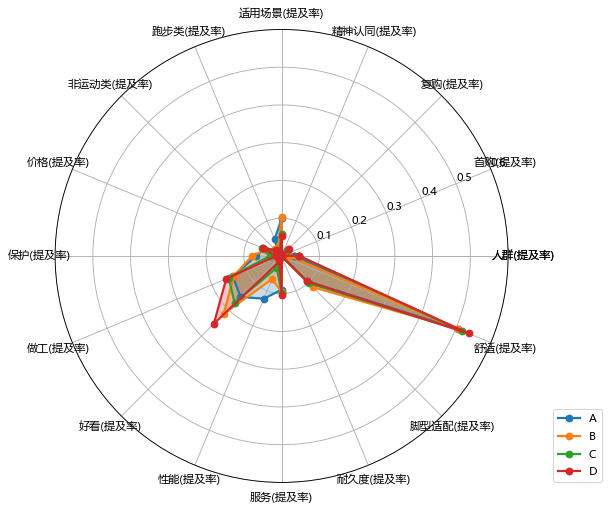

In [161]:
brands = list(seg_stat_by_product['segment_manually'])
radar_tag_in_one(seg_stat_by_product, attribution_1, 0, 0.6)

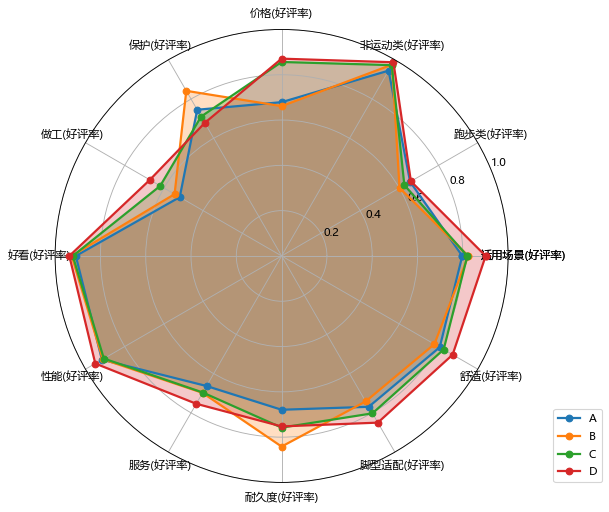

In [162]:
radar_tag_in_one(seg_stat_by_product, attribution_2, 0, 1)

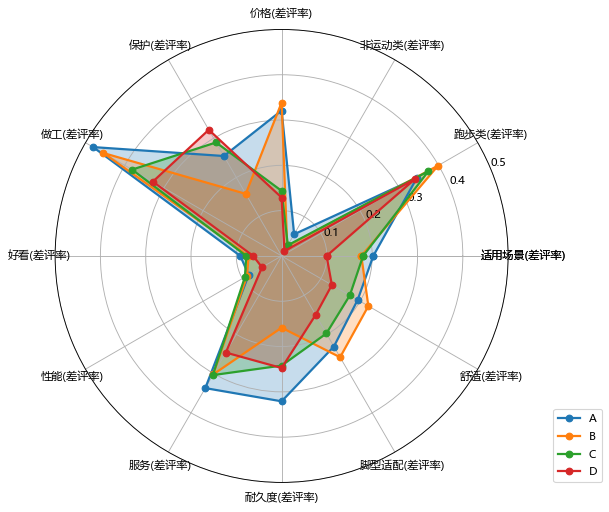

In [163]:
radar_tag_in_one(seg_stat_by_product, attribution_3, 0, 0.5)

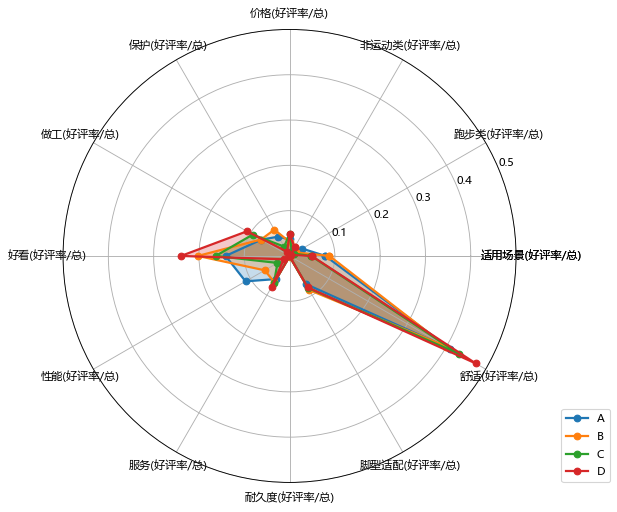

In [168]:
radar_tag_in_one(seg_stat_by_product, attribution_4, 0, 0.5)

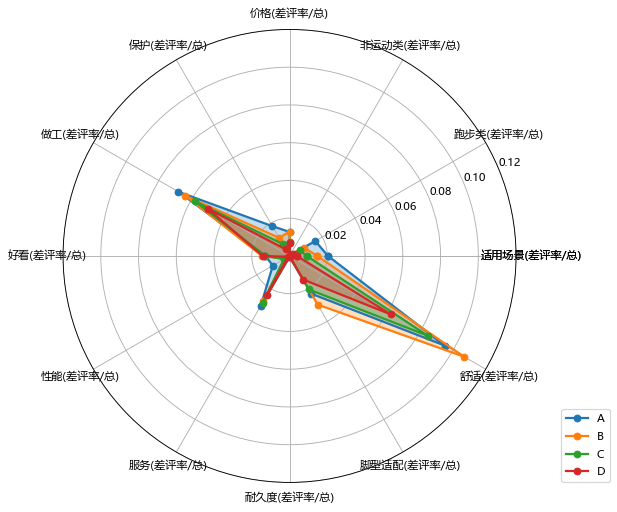

In [167]:
radar_tag_in_one(seg_stat_by_product, attribution_5, 0, 0.12)

In [20]:
'''
def comment_stat(df,classification_title):
    # tag_2
    brand_comment_stat_tag_2 = pd.DataFrame(brand_product_comment_stat_tag_2.groupby([classification_title])[aspect_final].sum()).reset_index()
    brand_comment_stat_tag_2
    
    # tag_1
    brand_comment_stat_tag_1 = pd.DataFrame()
    brands = list(brand_comment_stat_tag_2[classification_title])
    for brand in brands:
        tag_score = {}
        tag_score[classification_title] = brand
        for i in range(len(aspect)):
            if aspect[i][1].find('正面') > 0:
                tag_score[aspect[i][0] + '(正面)'] = tag_score.get(aspect[i][0] + '(正面)', 0.0) + brand_comment_stat_tag_2[aspect[i]][brands.index(brand)]
            elif aspect[i][1].find('负面') > 0:
                tag_score[aspect[i][0] + '(负面)'] = tag_score.get(aspect[i][0] + '(负面)', 0.0) + brand_comment_stat_tag_2[aspect[i]][brands.index(brand)]
            else:
                tag_score[aspect[i][0]] = tag_score.get(aspect[i][0], 0.0) + brand_comment_stat_tag_2[aspect[i]][brands.index(brand)]
        df=pd.DataFrame.from_dict(tag_score, orient='index').transpose()
        brand_comment_stat_tag_1 = pd.concat([brand_comment_stat_tag_1, df])
    brand_comment_stat_tag_1 = brand_comment_stat_tag_1.reset_index(drop=True)
        
    # score
    attribution = ['人群','首购','复购','精神认同','适用场景','价格','保护','做工','好看','性能','服务','耐久度','脚型适配','舒适']
    draw_data = []
    for brand in brands:
        draw_data.append({classification_title: brand, '评论数': brand_comment_stat_tag_2['评论数'][brands.index(brand)]})
        for tag in attribution:
            if tag in ['人群','首购','复购','精神认同']:
                score = brand_comment_stat_tag_1[tag][brands.index(brand)] / brand_comment_stat_tag_2['评论数'][brands.index(brand)]
                draw_data[-1][tag + '(提及率)'] = score
            else:
                score_1 = (brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] + brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)]) / brand_comment_stat_tag_2['评论数'][brands.index(brand)]
                score_2 = brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] / (brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] + brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)])
                score_3 = brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)] / (brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] + brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)])
                score_4 = brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] / brand_comment_stat_tag_2['评论数'][brands.index(brand)]
                score_5 = brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)] / brand_comment_stat_tag_2['评论数'][brands.index(brand)]
                draw_data[-1][tag + '(提及率)'] = score_1
                draw_data[-1][tag + '(好评率)'] = score_2
                draw_data[-1][tag + '(差评率)'] = score_3
                draw_data[-1][tag + '(好评率/总)'] = score_4
                draw_data[-1][tag + '(差评率/总)'] = score_5
                
    draw_data = pd.DataFrame(draw_data)
    
    return draw_data
'''

### 按照品牌统计

In [21]:
brand_stat = comment_stat(brand_product_comment_stat_tag_2, '品牌')
brand_stat

C:\Users\DWu60\Anaconda3\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)
C:\Users\DWu60\AppData\Local\Temp\1\ipykernel_14480\3805226939.py:34: RuntimeWarning: invalid value encountered in double_scalars
  score_2 = brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] / (brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] + brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)])
C:\Users\DWu60\AppData\Local\Temp\1\ipykernel_14480\3805226939.py:35: RuntimeWarning: invalid value encountered in double_scalars
  score_3 = brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)] / (brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] + brand_comment_stat_tag_1[t

,品牌,评论数,人群(提及率),首购(提及率),复购(提及率),精神认同(提及率),适用场景(提及率),适用场景(好评率),适用场景(差评率),适用场景(好评率/总),适用场景(差评率/总),价格(提及率),价格(好评率),价格(差评率),价格(好评率/总),价格(差评率/总),保护(提及率),保护(好评率),保护(差评率),保护(好评率/总),保护(差评率/总),做工(提及率),做工(好评率),做工(差评率),做工(好评率/总),做工(差评率/总),好看(提及率),好看(好评率),好看(差评率),好看(好评率/总),好看(差评率/总),性能(提及率),性能(好评率),性能(差评率),性能(好评率/总),性能(差评率/总),服务(提及率),服务(好评率),服务(差评率),服务(好评率/总),服务(差评率/总),耐久度(提及率),耐久度(好评率),耐久度(差评率),耐久度(好评率/总),耐久度(差评率/总),脚型适配(提及率),脚型适配(好评率),脚型适配(差评率),脚型适配(好评率/总),脚型适配(差评率/总),舒适(提及率),舒适(好评率),舒适(差评率),舒适(好评率/总),舒适(差评率/总)
0,361°,57207,0.048386,0.001241,0.023231,0.006083,0.045344,0.850424,0.149576,0.038562,0.006782,0.055885,0.908664,0.091336,0.050780,0.005104,0.028930,0.746828,0.253172,0.021606,0.007324,0.184663,0.584248,0.415752,0.107889,0.076774,0.169437,0.921180,0.078820,0.156082,0.013355,0.041743,0.912060,0.087940,0.038072,0.003671,0.083294,0.688982,0.311018,0.057388,0.025906,0.000769,0.750000,0.250000,0.000577,0.000192,0.094831,0.834839,0.165161,0.079169,0.015662,0.553901,0.886199,0.113801,0.490867,0.063034
1,ANTA/安踏,106495,0.052679,0.001202,0.023607,0.005690,0.056867,0.851882,0.148118,0.048444,0.008423,0.043561,0.829920,0.170080,0.036152,0.007409,0.016996,0.609945,0.390055,0.010367,0.006629,0.151331,0.640233,0.359767,0.096887,0.054444,0.195793,0.917558,0.082442,0.179652,0.016142,0.023579,0.943847,0.056153,0.022255,0.001324,0.104578,0.764748,0.235252,0.079976,0.024602,0.000742,0.658228,0.341772,0.000488,0.000254,0.092408,0.848999,0.151001,0.078454,0.013954,0.565247,0.862715,0.137285,0.487647,0.077600
2,Adidas/阿迪达斯,56931,0.033743,0.001493,0.020551,0.000545,0.032935,0.823467,0.176533,0.027121,0.005814,0.077427,0.880898,0.119102,0.068205,0.009222,0.026506,0.854871,0.145129,0.022659,0.003847,0.175107,0.550707,0.449293,0.096433,0.078674,0.131036,0.909920,0.090080,0.119232,0.011804,0.018110,0.879728,0.120272,0.015932,0.002178,0.105549,0.681811,0.318189,0.071964,0.033585,0.000562,0.718750,0.281250,0.000404,0.000158,0.088247,0.773288,0.226712,0.068241,0.020007,0.404437,0.705885,0.294115,0.285486,0.118951
3,Allbirds,400,0.025000,0.005000,0.032500,0.000000,0.255000,0.950980,0.049020,0.242500,0.012500,0.010000,0.500000,0.500000,0.005000,0.005000,0.077500,0.806452,0.193548,0.062500,0.015000,0.067500,0.814815,0.185185,0.055000,0.012500,0.305000,0.885246,0.114754,0.270000,0.035000,0.050000,1.000000,0.000000,0.050000,0.000000,0.102500,0.878049,0.121951,0.090000,0.012500,0.000000,NaN,NaN,0.000000,0.000000,0.092500,0.783784,0.216216,0.072500,0.020000,0.805000,0.925466,0.074534,0.745000,0.060000
4,Asics/亚瑟士,48641,0.030879,0.001891,0.021792,0.000678,0.070434,0.847052,0.152948,0.059662,0.010773,0.049814,0.835328,0.164672,0.041611,0.008203,0.046504,0.763042,0.236958,0.035484,0.011020,0.156864,0.487549,0.512451,0.076479,0.080385,0.205855,0.925996,0.074004,0.190621,0.015234,0.037314,0.896970,0.103030,0.033470,0.003844,0.104089,0.666206,0.333794,0.069345,0.034744,0.000822,0.825000,0.175000,0.000678,0.000144,0.123229,0.752252,0.247748,0.092700,0.030530,0.480993,0.806420,0.193580,0.387883,0.093111
5,Decathlon/迪卡侬,45209,0.035480,0.001283,0.029596,0.000288,0.060231,0.861183,0.138817,0.051870,0.008361,0.082329,0.933638,0.066362,0.076865,0.005464,0.029662,0.519016,0.480984,0.015395,0.014267,0.132474,0.612289,0.387711,0.081112,0.051361,0.113982,0.903939,0.096061,0.103033,0.010949,0.020615,0.891631,0.108369,0.018381,0.002234,0.078967,0.587675,0.412325,0.046407,0.032560,0.001194,0.851852,0.148148,0.001017,0.000177,0.089053,0.825633,0.174367,0.073525,0.015528,0.528744,0.851782,0.148218,0.450375,0.078369
6,Do－win/多威,13507,0.032576,0.002221,0.026209,0.002813,0.106537,0.794997,0.205003,0.084697,0.021841,0.051455,0.825899,0.174101,0.042496,0.008958,0.055601,0.700399,0.299601,0.038943,0.016658,0.143111,0.522504,0.477496,0.074776,0.068335,0.105057,0.895701,0.104299,0.094099,0.010957,0.066188,0.833333,0.166667,0.055157,0.011031,0.071370,0.713693,0.286307,0.050937,0.020434,0.002221,0.866667,0.133333,0.001925,0.000296,0.088917,0.755204,0.244796,0.067150,0.021766,0.437403,0.744922,0.255

### 按照MODEL_AD2统计

In [22]:
model_stat = comment_stat(brand_product_comment_stat_tag_2, 'MODEL_AD2')
model_stat

C:\Users\DWu60\Anaconda3\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)
C:\Users\DWu60\AppData\Local\Temp\1\ipykernel_14480\3805226939.py:34: RuntimeWarning: invalid value encountered in double_scalars
  score_2 = brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] / (brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] + brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)])
C:\Users\DWu60\AppData\Local\Temp\1\ipykernel_14480\3805226939.py:35: RuntimeWarning: invalid value encountered in double_scalars
  score_3 = brand_comment_stat_tag_1[tag + '(负面)'][brands.index(brand)] / (brand_comment_stat_tag_1[tag + '(正面)'][brands.index(brand)] + brand_comment_stat_tag_1[t

,MODEL_AD2,评论数,人群(提及率),首购(提及率),复购(提及率),精神认同(提及率),适用场景(提及率),适用场景(好评率),适用场景(差评率),适用场景(好评率/总),适用场景(差评率/总),价格(提及率),价格(好评率),价格(差评率),价格(好评率/总),价格(差评率/总),保护(提及率),保护(好评率),保护(差评率),保护(好评率/总),保护(差评率/总),做工(提及率),做工(好评率),做工(差评率),做工(好评率/总),做工(差评率/总),好看(提及率),好看(好评率),好看(差评率),好看(好评率/总),好看(差评率/总),性能(提及率),性能(好评率),性能(差评率),性能(好评率/总),性能(差评率/总),服务(提及率),服务(好评率),服务(差评率),服务(好评率/总),服务(差评率/总),耐久度(提及率),耐久度(好评率),耐久度(差评率),耐久度(好评率/总),耐久度(差评率/总),脚型适配(提及率),脚型适配(好评率),脚型适配(差评率),脚型适配(好评率/总),脚型适配(差评率/总),舒适(提及率),舒适(好评率),舒适(差评率),舒适(好评率/总),舒适(差评率/总)
0,1080 SERIES,227,0.013216,0.000000,0.022026,0.000000,0.154185,0.714286,0.285714,0.110132,0.044053,0.057269,0.538462,0.461538,0.030837,0.026432,0.092511,0.714286,0.285714,0.066079,0.026432,0.154185,0.485714,0.514286,0.074890,0.079295,0.114537,0.923077,0.076923,0.105727,0.008811,0.211454,0.937500,0.062500,0.198238,0.013216,0.052863,0.500000,0.500000,0.026432,0.026432,0.004405,1.000000,0.000000,0.004405,0.000000,0.092511,0.809524,0.190476,0.074890,0.017621,0.713656,0.740741,0.259259,0.528634,0.185022
1,160,204,0.122549,0.000000,0.039216,0.000000,0.009804,1.000000,0.000000,0.009804,0.000000,0.034314,1.000000,0.000000,0.034314,0.000000,0.004902,1.000000,0.000000,0.004902,0.000000,0.210784,0.976744,0.023256,0.205882,0.004902,0.147059,0.966667,0.033333,0.142157,0.004902,0.014706,1.000000,0.000000,0.014706,0.000000,0.029412,1.000000,0.000000,0.029412,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.039216,1.000000,0.000000,0.039216,0.000000,0.284314,0.948276,0.051724,0.269608,0.014706
2,160X,442,0.020362,0.013575,0.020362,0.020362,0.095023,0.928571,0.071429,0.088235,0.006787,0.033937,0.733333,0.266667,0.024887,0.009050,0.085973,0.815789,0.184211,0.070136,0.015837,0.070136,0.612903,0.387097,0.042986,0.027149,0.187783,0.987952,0.012048,0.185520,0.002262,0.201357,0.910112,0.089888,0.183258,0.018100,0.056561,0.320000,0.680000,0.018100,0.038462,0.000000,NaN,NaN,0.000000,0.000000,0.074661,0.939394,0.060606,0.070136,0.004525,0.386878,0.859649,0.140351,0.332579,0.054299
3,2FILA斐乐老爹鞋女飞船鞋2021春新款鞋潮流运动鞋ins潮复古增高,271,0.025830,0.000000,0.011070,0.000000,0.081181,1.000000,0.000000,0.081181,0.000000,0.011070,1.000000,0.000000,0.011070,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.129151,0.514286,0.485714,0.066421,0.062731,0.483395,0.931298,0.068702,0.450185,0.033210,0.000000,NaN,NaN,0.000000,0.000000,0.140221,0.815789,0.184211,0.114391,0.025830,0.000000,NaN,NaN,0.000000,0.000000,0.099631,0.592593,0.407407,0.059041,0.040590,0.568266,0.948052,0.051948,0.538745,0.029520
4,3301T特步女跑鞋879118110001,894,0.061521,0.000000,0.032438,0.001119,0.008949,0.875000,0.125000,0.007830,0.001119,0.034676,1.000000,0.000000,0.034676,0.000000,0.003356,0.333333,0.666667,0.001119,0.002237,0.158837,0.915493,0.084507,0.145414,0.013423,0.131991,0.983051,0.016949,0.129754,0.002237,0.002237,1.000000,0.000000,0.002237,0.000000,0.050336,0.911111,0.088889,0.045861,0.004474,0.000000,NaN,NaN,0.000000,0.000000,0.064877,0.931034,0.068966,0.060403,0.004474,0.589485,0.977230,0.022770,0.576063,0.013423
5,3354T特步男跑鞋880419116612,126,0.119048,0.000000,0.023810,0.000000,0.007937,1.000000,0.000000,0.007937,0.000000,0.055556,1.000000,0.000000,0.055556,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.182540,0.956522,0.043478,0.174603,0.007937,0.119048,1.000000,0.000000,0.119048,0.000000,0.007937,1.000000,0.000000,0.007937,0.000000,0.023810,1.000000,0.000000,0.023810,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.055556,1.000000,0.000000,0.055556,0.000000,0.428571,0.944444,0.055556,0.404762,0.023810
6,361女鞋运动鞋2021秋季新款减震轻便跑鞋休闲鞋子软底跑步鞋女士,3013,0.035513,0.000664,0.022901,0.002655,0.061732,0.876344,0.123656,0.054099,0.007634,0.048125,0.944828,0.055172,0.045470,0.002655,0.008629,0.769231,0.230769,0.006638,0.001991,0.148357,0.619687,0.380313,0.091935,0.056422,0.387985,0.924722,0.075278,0.358779,0.029207,0.013276,1.000000,0.000000,0.013276,0.000000,0.082310,0.693548,0.306452,0.057086,0.025224,0.000000,NaN,NaN,0.000000,0.000000,0.091271,0.781818,0.218182,0.071357,0.019914,0.607368,0.840437,0.159563,0.510455,0.0

### 按照segment_manually统计

In [23]:
seg_stat = comment_stat(brand_product_comment_stat_tag_2, 'segment_manually')
seg_stat

C:\Users\DWu60\Anaconda3\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)


,segment_manually,评论数,人群(提及率),首购(提及率),复购(提及率),精神认同(提及率),适用场景(提及率),适用场景(好评率),适用场景(差评率),适用场景(好评率/总),适用场景(差评率/总),价格(提及率),价格(好评率),价格(差评率),价格(好评率/总),价格(差评率/总),保护(提及率),保护(好评率),保护(差评率),保护(好评率/总),保护(差评率/总),做工(提及率),做工(好评率),做工(差评率),做工(好评率/总),做工(差评率/总),好看(提及率),好看(好评率),好看(差评率),好看(好评率/总),好看(差评率/总),性能(提及率),性能(好评率),性能(差评率),性能(好评率/总),性能(差评率/总),服务(提及率),服务(好评率),服务(差评率),服务(好评率/总),服务(差评率/总),耐久度(提及率),耐久度(好评率),耐久度(差评率),耐久度(好评率/总),耐久度(差评率/总),脚型适配(提及率),脚型适配(好评率),脚型适配(差评率),脚型适配(好评率/总),脚型适配(差评率/总),舒适(提及率),舒适(好评率),舒适(差评率),舒适(好评率/总),舒适(差评率/总)
0,A,136500,0.035912,0.003179,0.021524,0.005663,0.083978,0.834686,0.165314,0.070095,0.013883,0.064396,0.862457,0.137543,0.055538,0.008857,0.043531,0.756143,0.243857,0.032916,0.010615,0.148066,0.561773,0.438227,0.083179,0.064886,0.164945,0.927204,0.072796,0.152938,0.012007,0.119553,0.940866,0.059134,0.112484,0.007070,0.092784,0.693407,0.306593,0.064337,0.028447,0.001187,0.697531,0.302469,0.000828,0.000359,0.084000,0.794610,0.205390,0.066747,0.017253,0.514330,0.844486,0.155514,0.434344,0.079985
1,B,38344,0.026393,0.001513,0.020838,0.000887,0.061157,0.865245,0.134755,0.052916,0.008241,0.060844,0.822975,0.177025,0.050073,0.010771,0.056254,0.899397,0.100603,0.050595,0.005659,0.155461,0.501426,0.498574,0.077952,0.077509,0.179767,0.920934,0.079066,0.165554,0.014213,0.033695,0.914087,0.085913,0.030800,0.002895,0.106170,0.680914,0.319086,0.072293,0.033878,0.000808,0.806452,0.193548,0.000652,0.000156,0.097825,0.743535,0.256465,0.072736,0.025089,0.462237,0.770481,0.229519,0.356144,0.106092
2,C,319964,0.050681,0.001325,0.027716,0.003247,0.052840,0.842373,0.157627,0.044511,0.008329,0.056885,0.885391,0.114609,0.050365,0.006519,0.023440,0.689467,0.310533,0.016161,0.007279,0.160796,0.651908,0.348092,0.104824,0.055972,0.174926,0.925800,0.074200,0.161946,0.012980,0.027734,0.930696,0.069304,0.025812,0.001922,0.100374,0.722350,0.277650,0.072505,0.027869,0.000759,0.786008,0.213992,0.000597,0.000163,0.099224,0.818445,0.181555,0.081209,0.018015,0.525434,0.854217,0.145783,0.448835,0.076599
3,D,404703,0.048290,0.001038,0.026076,0.003736,0.044494,0.908758,0.091242,0.040435,0.004060,0.051702,0.893089,0.106911,0.046175,0.005528,0.012876,0.606985,0.393015,0.007816,0.005061,0.155381,0.679993,0.320007,0.105658,0.049723,0.233702,0.940442,0.059558,0.219783,0.013919,0.013615,0.952450,0.047550,0.012968,0.000647,0.100385,0.772461,0.227539,0.077543,0.022841,0.000675,0.761905,0.238095,0.000514,0.000161,0.096394,0.849760,0.150240,0.081912,0.014482,0.509902,0.890201,0.109799,0.453916,0.055987


### 输出结果

In [70]:
sum(brand_stat['评论数'])
brand_stat.to_excel('C:/Users/DWu60/Desktop/Case1_NLP/result_analyse/brand_stat.xlsx')

In [71]:
sum(model_stat['评论数'])
model_stat.to_excel('C:/Users/DWu60/Desktop/Case1_NLP/result_analyse/model_stat.xlsx')

In [ ]:
sum(seg_stat['评论数'])
seg_stat.to_excel('C:/Users/DWu60/Desktop/Case1_NLP/result_analyse/seg_stat.xlsx')

# 雷达图

In [24]:
def radar_tag_in_one(df, attribution):
    # 设置雷达图角度，平分切开一个圆面
    angles = np.linspace(0, 2*np.pi, len(attribution), endpoint=False)
    angles = np.concatenate((angles,[angles[0]]))
    feature = np.concatenate((attribution,[attribution[0]]))
    
    # 设置绘图
    fig = plt.figure(figsize=(15,7.5), dpi=80)
    ax = fig.add_subplot(111, polar=True)
    
    # 遍历brand并绘图
    for brand in brands:
        # 将雷达图中的折线图封闭
        values = list(df.loc[brands.index(brand),attribution])
        values = np.concatenate((values, [values[0]]))
        # 绘图
        ax.plot(angles, values, 'o-', linewidth=2, label=brand)
        ax.fill(angles, values, alpha=0.25)
        ax.set_thetagrids(angles*180/np.pi, feature)
        ax.set_ylim(0,1)
        ax.grid(True)
        
    # 显示图形
    plt.legend(bbox_to_anchor=(1.1, 0), loc=3, borderaxespad=0)
    plt.show()

### 提及率

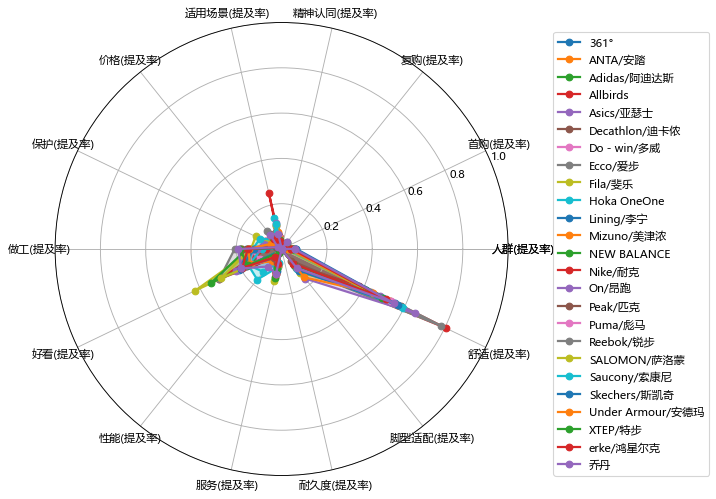

In [30]:
brands = list(brand_stat['品牌'])
radar_tag_in_one(brand_stat, attribution_1)

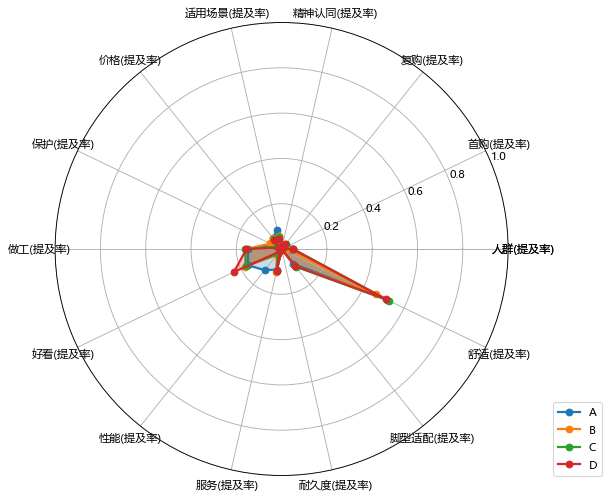

In [31]:
brands = list(seg_stat['segment_manually'])
radar_tag_in_one(seg_stat, attribution_1)

### 好评率

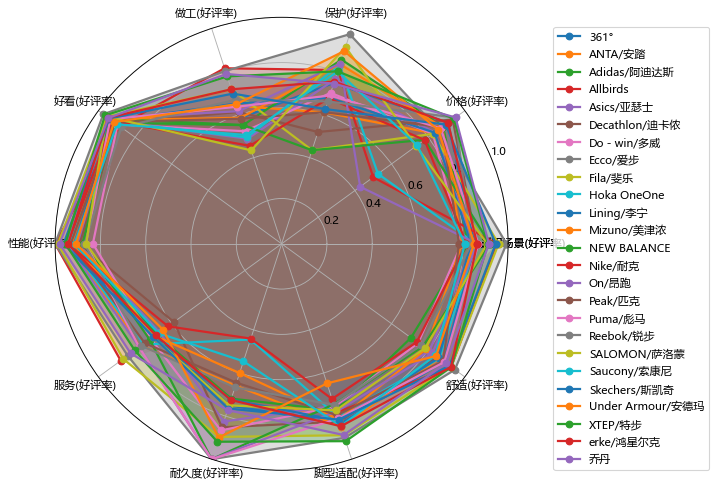

In [32]:
brands = list(brand_stat['品牌'])
radar_tag_in_one(brand_stat, attribution_2)

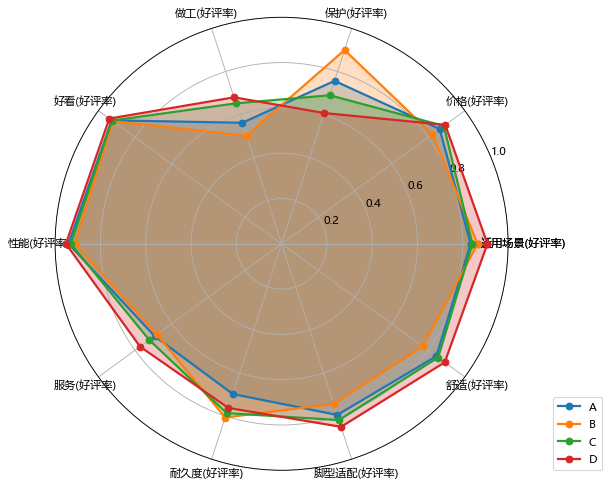

In [33]:
brands = list(seg_stat['segment_manually'])
radar_tag_in_one(seg_stat, attribution_2)

### 差评率

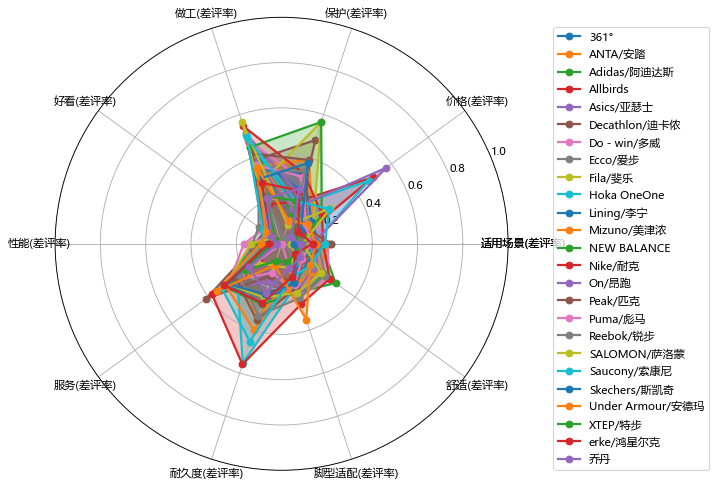

In [34]:
brands = list(brand_stat['品牌'])
radar_tag_in_one(brand_stat, attribution_3)

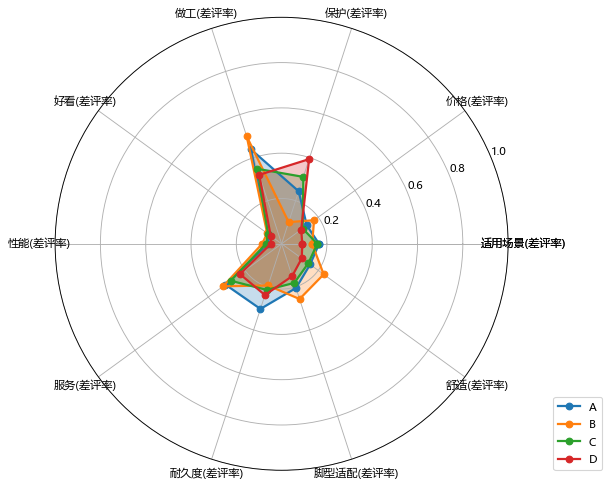

In [35]:
brands = list(seg_stat['segment_manually'])
radar_tag_in_one(seg_stat, attribution_3)